In [1]:
import sys, os
sys.path.append("../../")
import torch

import pkg_resources
pkg_resources.require("faiss-gpu==1.7.2")
pkg_resources.require("cupy-cuda11x==11.0.0")
pkg_resources.require("pytorch_lightning==1.9.0")

import matplotlib
from Scripts import train_metric_learning, run_metric_learning_inference, train_gnn, run_gnn_inference, build_track_candidates, evaluate_candidates
from Scripts.utils.convenience_utils import get_example_data, plot_true_graph, get_training_metrics, plot_training_metrics, plot_neighbor_performance, plot_predicted_graph, plot_track_lengths, plot_edge_performance, plot_graph_sizes
import yaml

import warnings
warnings.filterwarnings("ignore")
CONFIG = 'pipeline_config_multimuon.yaml'

/data/dust/user/bauckhag/code/TrackML/source/venv/env_trackml/lib64/python3.9/site-packages/networkx/utils/backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


Loading BokehJS ...

Loading BokehJS ...

/data/dust/user/bauckhag/code/TrackML/source/venv/env_trackml/lib64/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# test gpu
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))
print(torch.cuda.current_device())

In [2]:
with open(CONFIG, 'r') as f:
    configs = yaml.load(f, Loader=yaml.FullLoader)

In [3]:
example_data_df, example_data_pyg = get_example_data(configs)
example_data_df.head(10)

Loading dataset from /data/dust/user/bauckhag/code/TrackML/data/multiMuonGun/output_featurestore_pt8_nonoise/


,0,1,2,3
0,0.030165,-0.876297,-0.001092,-0.024723
1,0.030165,-0.876297,-0.001092,-0.024723
2,0.030165,-0.876297,-0.001092,-0.024723
3,0.030165,-0.876297,-0.001092,-0.024723
4,0.030165,-0.876297,-0.001092,-0.024723
5,0.030168,-0.995642,-0.000233,0.041997
6,0.030168,-0.995642,-0.000233,0.041997
7,0.030168,-0.995642,-0.000233,0.041997
8,0.030168,-0.995642,-0.000233,0.041997
9,0.030168,-0.995642,-0.000233,0.041997


### Visualize tracks

A "true track" is defined as a set of sequential hits, all left by the same particle. Therefore a true edge is the edge formed by two sequential hits. Let's visualize a random set of 200 true tracks:

In [4]:
example_data_df_copy = example_data_df.copy().drop_duplicates()
print(len(example_data_df_copy), len(example_data_df))

2513 18036


In [7]:
plot_true_graph(example_data_pyg, num_tracks=200, configs=configs)

# 1. Train Metric Learning

## Train metric learning model

Finally we come to model training. By default, we train the MLP for 30 epochs, which takes approximately 15 minutes on an NVidia V100. Feel free to adjust the epoch number in pipeline_config.yml

In [5]:
metric_learning_trainer, metric_learning_model = train_metric_learning(CONFIG)

INFO:-------------------- Step 1: Running metric learning training --------------------
INFO:----------------------------- a) Initialising model -----------------------------
INFO:------------------------------ b) Running training ------------------------------


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Missing logger folder: /data/dust/user/bauckhag/code/TrackML/data/multiMuonGun/artifacts/metric_learning/multimuongun_pt8_vonly


Loading dataset from /data/dust/user/bauckhag/code/TrackML/data/multiMuonGun/output_featurestore_pt8_vonly/


RuntimeError: CUDA error: out of memory
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


## Plot training metrics

We can examine how the training went. This is stored in a simple dataframe:

In [4]:
embedding_metrics = get_training_metrics(metric_learning_trainer)
embedding_metrics.head()

,epoch,train_loss,val_loss,eff,pur,current_lr
0,0,0.009696,0.009910,0.899280,0.001398,0.000125
1,1,0.009605,0.009880,0.880836,0.001387,0.000250
2,2,0.009430,0.009730,0.919748,0.001469,0.000375
3,3,0.009342,0.009471,0.974611,0.001899,0.000350
4,4,0.009308,0.009560,0.983114,0.001953,0.000625


In [5]:
#import pandas as pd
#from Pipelines.TrackML_Example.LightningModules.Embedding.Models.layerless_embedding import LayerlessEmbedding

#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#embedding_metrics = pd.read_csv(os.path.join(configs['common_configs']['plot_output_directory'],'embedding_metrics.csv'))
#metric_learning_model = LayerlessEmbedding.load_from_checkpoint(os.path.join(configs['common_configs']["artifact_directory"], "metric_learning", configs['common_configs']["experiment_name"]+".ckpt")).to(device)
#torch.load(os.path.join(configs['common_configs']['artifact_directory'], "metric_learning", configs['common_configs']['experiment_name'], "version_6", "checkpoints", 'epoch=19-step=1600.ckpt'))

In [6]:
plot_training_metrics(embedding_metrics)

## Evaluate model performance on sample test data

Here we evaluate the model performace on one sample test data. We look at how the efficiency and purity change with the embedding radius.

In [7]:
plot_neighbor_performance(metric_learning_model)

## Plot example truth and predicted graphs

In [8]:
plot_predicted_graph(metric_learning_model)

## Track lengths

In [9]:
plot_track_lengths(metric_learning_model)

  0%|                                                                                                                                                                          | 0/80 [00:00<?, ?it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 80/80 [02:19<00:00,  1.74s/it]


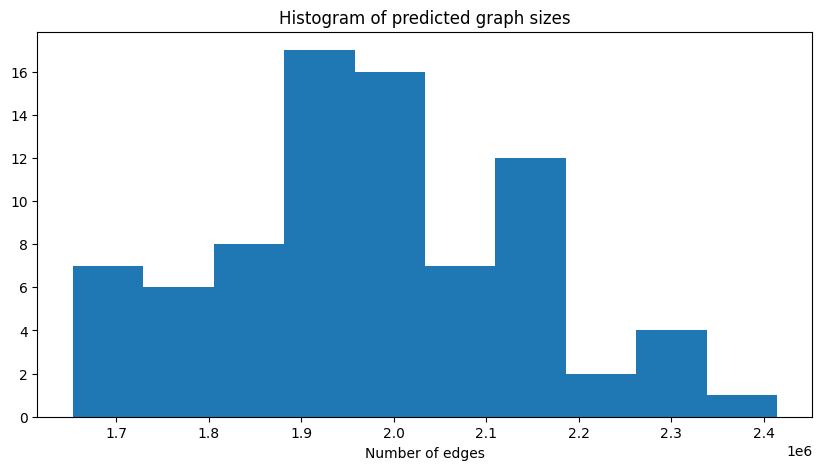

In [10]:
plot_graph_sizes(metric_learning_model)

# 2. Construct graphs from metric learning inference

This step performs model inference on the entire input datasets (train, validation and test), to obtain input graphs to the graph neural network. Optionally, we also clear the directory.

In [11]:
graph_builder = run_metric_learning_inference(CONFIG)

INFO:------------- Step 2: Constructing graphs from metric learning model -------------
INFO:---------------------------- a) Loading trained model ----------------------------


INFO:----------------------------- b) Running inferencing -----------------------------


Loading dataset from /data/dust/user/bauckhag/code/TrackML/data/multiMuonGun/output_featurestore_pt8/
Training finished, running inference to build graphs...


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:59<00:00,  5.97s/it]


# 3. Train graph neural networks

We have a set of graphs constructed. We now train a GNN to classify edges as either "true" (belonging to the same track) or "false" (not belonging to the same track).

In [12]:
gnn_trainer, gnn_model = train_gnn(CONFIG)

INFO:-------------------------  Step 3: Running GNN training  -------------------------
INFO:----------------------------- a) Initialising model -----------------------------
INFO:------------------------------ b) Running training ------------------------------


MisconfigurationException: `CUDAAccelerator` can not run on your system since the accelerator is not available. The following accelerator(s) is available and can be passed into `accelerator` argument of `Trainer`: ['cpu'].

## Plot training metrics

In [ ]:
gnn_metrics = get_training_metrics(gnn_trainer)
gnn_metrics.head()

,epoch,train_loss,val_loss,eff,pur,current_lr
0,0,0.020973,0.034222,1.0,1.0,0.0002
1,1,0.008060,0.012927,1.0,1.0,0.0004
2,2,0.003254,0.004925,1.0,1.0,0.0006
3,3,0.001525,0.002141,1.0,1.0,0.0008
4,4,0.000822,0.001086,1.0,1.0,0.0010


In [ ]:
plot_training_metrics(gnn_metrics)

## Evaluate model performance on sample test data

Here we evaluate the model performace on one sample test data. We look at how the efficiency and purity change with the embedding radius.

In [ ]:
plot_edge_performance(gnn_model)

# Step 4: GNN inference

In [ ]:
run_gnn_inference(CONFIG)

INFO:--------------------- Step 4: Scoring graph edges using GNN  ---------------------
INFO:---------------------------- a) Loading trained model ----------------------------


INFO:----------------------------- b) Running inferencing -----------------------------


Training finished, running inference to filter graphs...
Building train


Epoch 15:  51%|███████████████████████████████████████████████████████▏                                                    | 46/90 [1:12:02<1:08:54, 93.97s/it, loss=6.15e-05, v_num=4]


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 80/80 [00:08<00:00,  9.76it/s]


Building val


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 10.13it/s]


Building test


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  3.57it/s]


# Step 5: Build track candidates from GNN

In [ ]:
build_track_candidates(CONFIG)

INFO:-----------  Step 5: Building track candidates from the scored graph  -----------
INFO:---------------------------- a) Loading scored graphs ----------------------------


INFO:---------------------------- b) Labelling graph nodes ----------------------------
100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:06<00:00, 15.35it/s]


# Step 6: Evaluate track candidates

We can control the matching style in the pipeline config file. The following all require at least a majority of hits to match in each scheme (i.e. matching fraction = 50%).
A discussion of each matching style and some worked examples can be found in the [Documentation](https://hsf-reco-and-software-triggers.github.io/Tracking-ML-Exa.TrkX/performance/matching_definitions/).

ATLAS style matching is the default.

INFO:------------ Step 6: Evaluating the track reconstruction performance ------------
INFO:--------------------------- a) Loading labelled graphs ---------------------------


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:01<00:00, 58.62it/s]
INFO:--------------------- b) Calculating the performance metrics ---------------------
INFO:Number of reconstructed particles: 99
INFO:Number of particles: 100
INFO:Number of matched tracks: 99
INFO:Number of tracks: 100
INFO:Number of duplicate reconstructed particles: 0
INFO:Efficiency: 0.990
INFO:Fake rate: 0.010
INFO:Duplication rate: 0.000
INFO:------------------------------ c) Plotting results ------------------------------


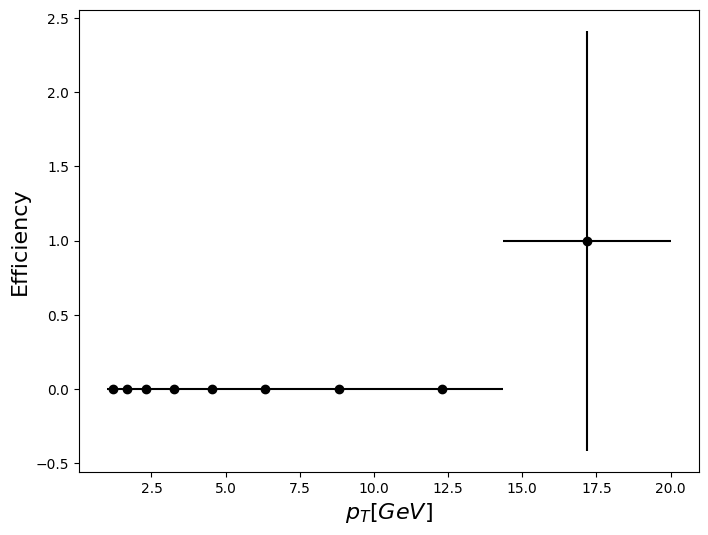

In [ ]:
evaluated_events, reconstructed_particles, particles, matched_tracks, tracks = evaluate_candidates(CONFIG)